# Image Classification using CNN



Image Classification (also called Image Recognition) is the process of labeling or categorizing an image from a set of predefined target classes. Traditionally, in machine learning, image classification solutions involved computing various types of features that were engineered for a particular problem domain. These features were then used as input to train a classifier, such as a Support Vector Machine (SVM) or multinomial Logistics Regression.

With the advent of Deep Convolutional Neural Networks (CNNs), the process has shifted to a more end-to-end learning process (instead of learning only the classifier). In contrast to traditional machine learning techniques, the features are also learned during the training of the CNNs. Deep CNNs can learn to classify images into thousands of classes. These networks also form the basis for many advanced computer vision problems like Segmentation and Object Detection. In this project, I will be building a classifier on a balls dataset to perform image classification using a hard-coded deep CNN. The content of the project are:
1. [Dataset Exploration](#1-Dataset-Exploration)
2. Data preprocessing
3. Train a Deep Neural Network Model
4. Model Evaluation
5. Conclusion

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import random
import numpy as np
import matplotlib.pyplot as plt
import requests
import glob as glob

from tensorflow.keras.utils import image_dataset_from_directory

from matplotlib.ticker import (
    MultipleLocator, FormatStrFormatter)
from dataclasses import dataclass

# Text formatting.
bold = "\033[1m"

block_plot = False
plt.rcParams['figure.figsize'] = (12, 9)
SEED_VALUE = 42
random.seed(SEED_VALUE)
np.random.seed(SEED_VALUE)
tf.random.set_seed(SEED_VALUE)

In [4]:
# Checking System Config
def system_config():

    # Get list of GPUs.
    gpu_devices = tf.config.list_physical_devices('GPU')
    print(gpu_devices)

    if len(gpu_devices) > 0:
        print('Using GPU')
        #os.environ["CUDA_VISIBLE_DEVICES"] = '0'
        #os.environ['TF_CUDNN_DETERMINISTIC'] = '1'

        # If there are any gpu devices, use first gpu.
        tf.config.experimental.set_visible_devices(gpu_devices[0], 'GPU')

        # Grow the memory usage as it is needed by the process.
        tf.config.experimental.set_memory_growth(gpu_devices[0], True)

        # Enable using cudNN.
        #os.environ['TF_USE_CUDNN'] = "true"
    else:
        print('Using CPU')

system_config()

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Using GPU


## 1. Dataset Exploration
I am using a dataset from [Kaggle](https://www.kaggle.com/datasets/gpiosenka/balls-image-classification) that contains different type of balls. The dataset contains images of 3615 balls from 30 classes. The dataset is unbalanced, however, the ball in each image covers atleast 50% of the pixels, which means dataset is of high quality. The format of each image is 224x224x3.


### 1.1 Download & Extract the Dataset

In [21]:
def download_file(url, save_name):
    url = url
    file = requests.get(url)

    open(save_name, 'wb').write(file.content)

download_file('https://www.kaggle.com/datasets/gpiosenka/balls-image-classification/download?datasetVersionNumber=6', 'dataset_balls.zip')

In [5]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
    print("User uploaded file '{name}' with length {length} bytes".format(name=fn, length=len(uploaded[fn])))

Saving archive.zip to archive.zip
User uploaded file 'archive.zip' with length 151134833 bytes


In [6]:
!unzip archive.zip   # unable to fig out the download part, so uploaded archive and unzip it


Archive:  archive.zip
  inflating: EfficientNetB0 model-30-(224 X 224)- 99.33.h5  
  inflating: balls.csv               
  inflating: test/baseball/1.jpg     
  inflating: test/baseball/2.jpg     
  inflating: test/baseball/3.jpg     
  inflating: test/baseball/4.jpg     
  inflating: test/baseball/5.jpg     
  inflating: test/basketball/1.jpg   
  inflating: test/basketball/2.jpg   
  inflating: test/basketball/3.jpg   
  inflating: test/basketball/4.jpg   
  inflating: test/basketball/5.jpg   
  inflating: test/beachballs/1.jpg   
  inflating: test/beachballs/2.jpg   
  inflating: test/beachballs/3.jpg   
  inflating: test/beachballs/4.jpg   
  inflating: test/beachballs/5.jpg   
  inflating: test/billiard ball/1.jpg  
  inflating: test/billiard ball/2.jpg  
  inflating: test/billiard ball/3.jpg  
  inflating: test/billiard ball/4.jpg  
  inflating: test/billiard ball/5.jpg  
  inflating: test/bowling ball/1.jpg  
  inflating: test/bowling ball/2.jpg  
  inflating: test/bowling ball/

### 1.2 Dataset Directory Structure
Let's take a look at how the images and folders are structured. This will be of particular importance when using
`image_dataset_from_directory()`. There are two top-level directories called `train`, `valid` and `test`, and each of these contains subdirectories for each of the classes in the dataset. Each of the class subfolders in turn, contains the images for the respective classes. Not all datasets are conveniently split into train and validation components, but we will use `image_dataset_from_directory()` which has the flexibilty to split the data into train and validation components if required.

In [10]:
# Class names.
# Get all items in the 'train' folder
class_names = sorted(glob.glob('train/*'))

# Print the items
for i, name in enumerate(class_names):
    print(i, name.split('/')[-1])

0 baseball
1 basketball
2 beachballs
3 billiard ball
4 bowling ball
5 brass
6 buckeyballs
7 cannon ball
8 chrochet ball
9 cricket ball
10 crystal ball
11 eyeballs
12 football
13 golf ball
14 marble
15 meat ball
16 medicine ball
17 paint balls
18 pokeman balls
19 puffballs
20 rubberband ball
21 screwballs
22 sepak takraw ball
23 soccer ball
24 tennis ball
25 tether ball
26 volley ball
27 water polo ball
28 wiffle ball
29 wrecking ball


There are 30 classes altogether of balls in training set.

### 1.3 Dataset Visualization
Lets start by exploring the image data using conventional methods

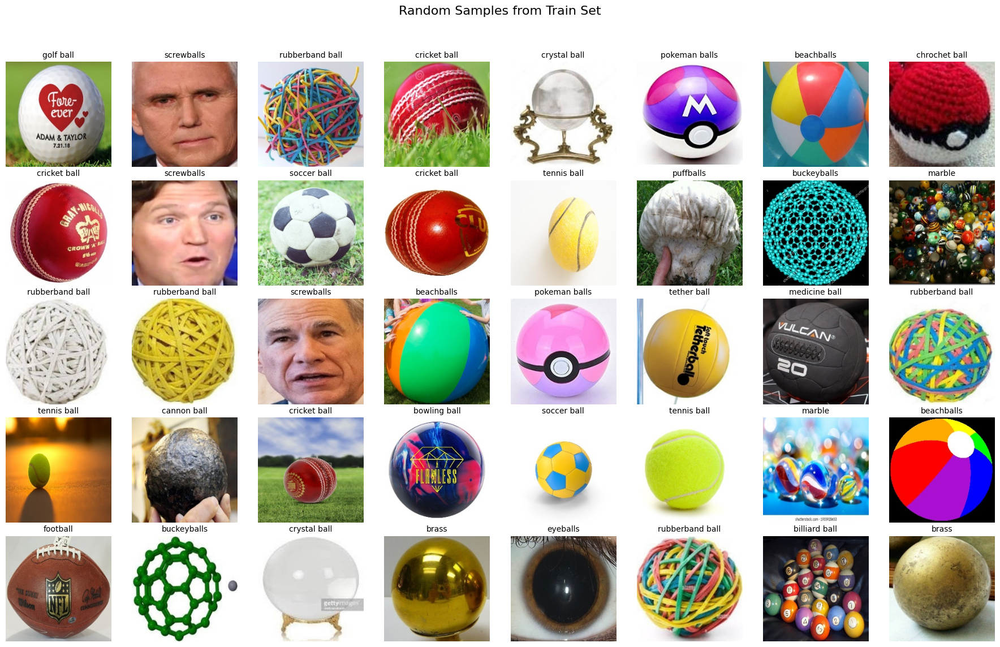

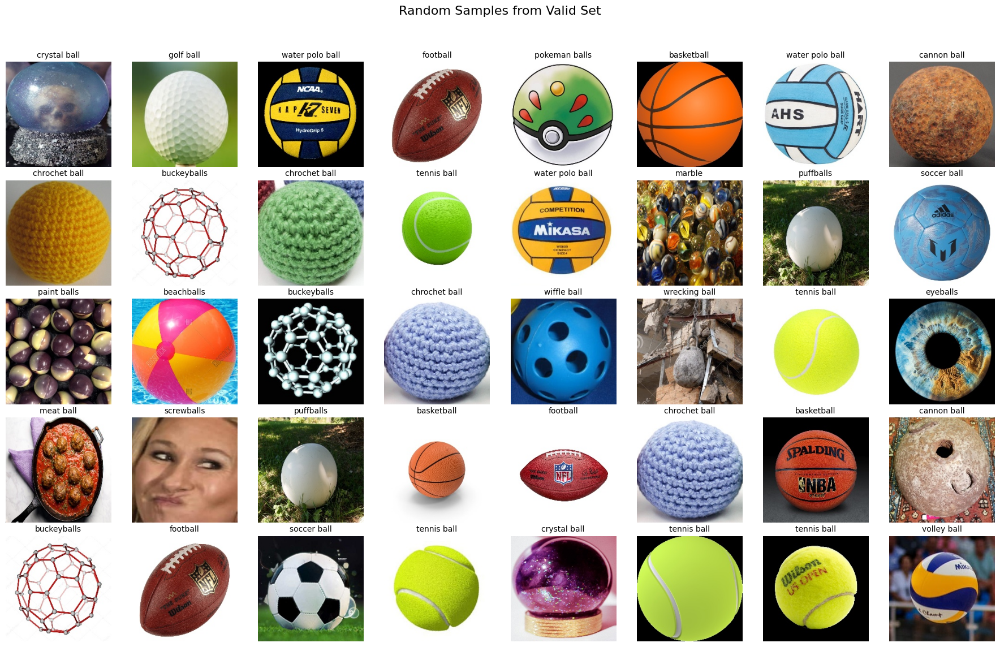

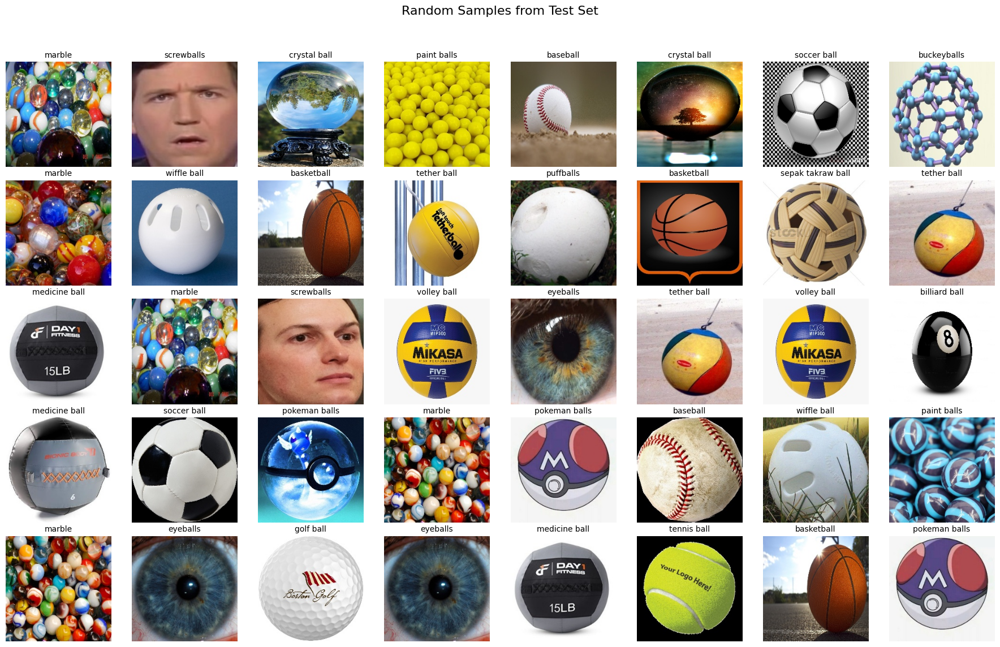

In [11]:
def get_all_image_paths(dir_path):
    """
    Retrieve all the image paths from the specified directory.
    """
    # Retrieve all the images paths.
    image_paths = glob.glob(f"{dir_path}/*/*") # glob returns a list of paths matching a pathname pattern.
    return image_paths

def display_dataset_samples(image_paths, title, num_rows=5, num_cols=8):
    """
    Randomly display some images from the dataset.
    """
    plt.figure(figsize=(18, 12))
    plt.suptitle(title, fontsize=16)
    for i in range(num_rows*num_cols):
        plt.subplot(num_rows, num_cols, i+1)

        # Generate a random index.
        random_idx = random.choice(list(range(0, len(image_paths))))
        image = plt.imread(image_paths[random_idx])
        label = image_paths[random_idx].split('/')[-2]
        plt.imshow(image)
        plt.axis('off')
        plt.title(label, fontsize=10)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the padding
    plt.show()

# Define your main dataset directory paths
dataset_partitions = ['train', 'valid', 'test']

# Loop through each dataset partition and visualize random samples
for partition in dataset_partitions:
    image_paths = get_all_image_paths(partition)
    display_dataset_samples(image_paths, title=f"Random Samples from {partition.capitalize()} Set")

Upon visualizing the random samples, it appeared in the datasets, faces appears, and some pictures contains more than one ball. Also, a pizza pan or cooking pan cannot be a ball.

## 2. Data preprocessing
### 2.1 Set Data Configeration parameters

In [12]:
@dataclass(frozen=True)
class DatasetConfig:
    NUM_CLASSES:  int = 30
    IMG_HEIGHT:   int = 224
    IMG_WIDTH:    int = 224
    NUM_CHANNELS: int = 3
    BATCH_SIZE:   int = 64
    #DATA_ROOT:    str = 'E:/dataset_balls'

@dataclass(frozen=True)
class TrainingConfig:
    EPOCHS:         int   = 21
    LEARNING_RATE:  float = 0.001
    CHECKPOINT_DIR: str   = './saved_models_balls'   # Directory to save checkpoints

data_config = DatasetConfig()
training_config = TrainingConfig()

# Set data paths.
train_path = 'train'
valid_path = 'valid'
test_path = 'test'

### 2.2 Create a `BatchDataset` objects
Here we use `image_dataset_from_directory()` to create `BatchDataset` objects for the **train**, **validation** and **test** data. There are numerous optional input arguments available, as previously noted. In the examples below, we use just a few of the optional arguments to specify the size of the images and the batch size for the dataset.

**Note:** One important input argument is the `batch_size` of the data. This is defaulted to 32, but regardless of the value, it's important to note that when we use a `BatchDataset` object, there is no need to specify a "batch_size" for training in the `Model.fit()` method since the `BatchDataset` object has already been partitioned into batches.  

We also specify a `label_mode` that will one-hot encode the class labels as well as a `seed` value for repeatability since the data is first shuffled before creating the `BatchDataset` objects (note: `shuffle` is defaulted to `True`). As we will see further below, these objects have several methods that will allow us to access and manage the data throughout the processing pipeline.

In [13]:
input_shape = (data_config.IMG_HEIGHT, data_config.IMG_WIDTH)
batch_size = data_config.BATCH_SIZE

train_dataset = image_dataset_from_directory(directory=train_path,
                                             image_size=input_shape,
                                             batch_size=batch_size,
                                             seed=SEED_VALUE,
                                             label_mode='categorical')

valid_dataset = image_dataset_from_directory(directory=valid_path,
                                             image_size=input_shape,
                                             batch_size=batch_size,
                                             seed=SEED_VALUE,
                                             label_mode='categorical')

test_dataset = image_dataset_from_directory(directory=test_path,
                                             image_size=input_shape,
                                             batch_size=batch_size,
                                             seed=SEED_VALUE,
                                             label_mode='categorical')

Found 3595 files belonging to 30 classes.
Found 150 files belonging to 30 classes.
Found 150 files belonging to 30 classes.


### 2.3 inspect `BatchDataset` Objects


In [14]:
# Print the shape of the data and the aassociated labels.
for data_batch, labels_batch in train_dataset:
    print("data batch shape:", data_batch.shape)
    print("labels batch shape:", labels_batch.shape)
    break

data batch shape: (64, 224, 224, 3)
labels batch shape: (64, 30)


This means a batch contains 64 images, of size 224 x 224 and since images are colored, therefor 3 channels.

On the other hand, label shows a batch of 64 images, with 30 labels.

### 2.4 Use `BatchDataset` object to access image data

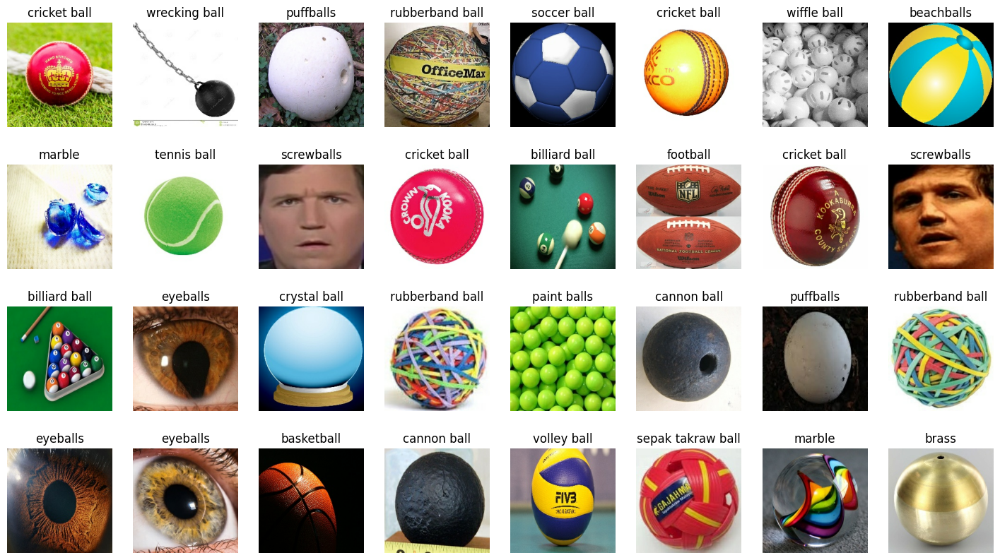

In [33]:
class_names = train_dataset.class_names        # this is a list of class names.

plt.figure(figsize=(18, 10))

# Assumes dataset batch_size is at least 32.
num_rows = 4
num_cols = 8

# Here we use the take() method to retrieve just the first batch of data from the training portion of the dataset.
for data_batch, labels_batch in train_dataset.take(1):

    # For the batch of images and the associated (one-hot encoded) labels,
    # plot each of the images in the batch and the associated ground truth labels.
    for i in range(num_rows*num_cols):
        ax = plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(data_batch[i].numpy().astype("uint8"))
        truth_idx = np.nonzero(labels_batch[i].numpy())
        plt.title(class_names[truth_idx[0][0]])
        plt.axis("off")

# To loop through all batches in the dataset, use:
# for data_batch, labels_batch in train_dataset:

Upon proper inquiry with labels, images of faces are classified as screwballs.

## 3. Train a Deep Neural Network
Here we define a generic Convolutional Neural Network (CNN) that will perform image classification to demonstrate the full processing pipeline in the context of using a local dataset that is managed using `BatchDataset` objects. The network below shows the typical pattern used to develop CNN architectures that contain multiple convoluiotnal blocks consisting of 2 or more Conv2D layers followed by a pooling layer, where the number of filters in block increases in the latter stages of the network.

it is important to mention using Keras Functional API, instead of sequential APi.

In [15]:
# Define the model.
def cnn_model(input_shape=(224, 224, 3), num_classes=10):

    #----------------------------------------------
    # Input layer and Conv Block 1: 32-32-MaxPool.
    #----------------------------------------------
    inputs = keras.Input(shape=input_shape)

    x = layers.Rescaling(1./255)(inputs)

    x = layers.Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPool2D(pool_size=2, strides=2)(x)

    #-----------------------------------
    # Conv Block 2: 64-64-MaxPool.
    #-----------------------------------
    x = layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPool2D(pool_size=2, strides=2)(x)

    #-----------------------------------
    # Conv Block 3: 128-128-MaxPool.
    #-----------------------------------
    x = layers.Conv2D(filters=128, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.Conv2D(filters=128, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPool2D(pool_size=2, strides=2)(x)

    #-----------------------------------
    # Conv Block 4: 256-256-MaxPool.
    #-----------------------------------
    x = layers.Conv2D(filters=256, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.Conv2D(filters=256, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPool2D(pool_size=2, strides=2)(x)

    #------------------------------------
    # Flatten the convolutional features.
    #------------------------------------
    x = layers.Flatten()(x)

    # Fully connected layers.
    x = layers.Dense(512, activation='relu')(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs=inputs, outputs=outputs)

    return model

In [16]:
# Define the input shape.
input_shape = (data_config.IMG_HEIGHT, data_config.IMG_WIDTH, data_config.NUM_CHANNELS)

# Create the model.
model = cnn_model(input_shape=input_shape, num_classes=data_config.NUM_CLASSES)

print(model.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 64)      18496     
                                                             

In [17]:
# Compile the model.
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=training_config.LEARNING_RATE),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [18]:
# Create a model checkpoint callback to save the "best" model based on highest validation_accuracy.
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=training_config.CHECKPOINT_DIR,
                                                               save_weights_only=False,
                                                               monitor="val_accuracy",
                                                               mode="max",
                                                               save_best_only=True)

# Train the model.
training_results = model.fit(train_dataset,
                             epochs=training_config.EPOCHS,
                             validation_data=valid_dataset,
                             callbacks=model_checkpoint_callback)

Epoch 1/21
57/57 [==============================] - 42s 355ms/step - loss: 3.3814 - accuracy: 0.0462 - val_loss: 3.5294 - val_accuracy: 0.0333
Epoch 2/21
57/57 [==============================] - 18s 305ms/step - loss: 3.0817 - accuracy: 0.1374 - val_loss: 2.9720 - val_accuracy: 0.1867
Epoch 3/21
57/57 [==============================] - 17s 300ms/step - loss: 2.5501 - accuracy: 0.2812 - val_loss: 2.4999 - val_accuracy: 0.3267
Epoch 4/21
57/57 [==============================] - 18s 320ms/step - loss: 2.0035 - accuracy: 0.4292 - val_loss: 2.0811 - val_accuracy: 0.4133
Epoch 5/21
57/57 [==============================] - 18s 309ms/step - loss: 1.4808 - accuracy: 0.5711 - val_loss: 1.8895 - val_accuracy: 0.4533
Epoch 6/21
57/57 [==============================] - 18s 315ms/step - loss: 1.0316 - accuracy: 0.7007 - val_loss: 1.9731 - val_accuracy: 0.4933
Epoch 7/21
57/57 [==============================] - 18s 308ms/step - loss: 0.6681 - accuracy: 0.8050 - val_loss: 2.3853 - val_accuracy: 0.5267

Appearently model doesnt gave much accuracy, and certainly leads to overfitting.

### 3.1 Plot Training Results

In [42]:
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter)

def plot_results(metrics, ylabel=None, ylim=None, metric_name=None, color=None, title=None, block_plot=False):
    fig, ax = plt.subplots(figsize=(15, 4))

    if not (isinstance(metric_name, list) or isinstance(metric_name, tuple)):
        metrics = [metrics]
        metric_name = [metric_name]

    for idx, metric in enumerate(metrics):
        ax.plot(metric, color=color[idx])

    plt.xlabel("Epoch")
    plt.ylabel(ylabel)
    plt.title(title)  # Use the title parameter here
    plt.xlim([0, training_config.EPOCHS-1])
    plt.ylim(ylim)
    ax.xaxis.set_major_locator(MultipleLocator(2))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    plt.grid(True)
    plt.legend(metric_name)
    plt.show(block=block_plot)
    plt.close()




In [35]:
# Retrieve training results.
train_loss = training_results.history["loss"]
train_acc  = training_results.history["accuracy"]
valid_loss = training_results.history["val_loss"]
valid_acc  = training_results.history["val_accuracy"]

plot_results([ train_acc, valid_acc ],
            title = "Accuracy",
            ylabel="Accuracy",
            ylim = [0.0, 1.0],
            metric_name=["Training Accuracy", "Validation Accuracy"],
            color=["g", "b"])

plot_results([ train_loss, valid_loss ],
            title = "Loss",
            ylabel="Loss",
            ylim = [0.0, 5.0],
            metric_name=["Training Loss", "Validation Loss"],
            color=["g", "b"]);


TypeError: ignored

Classic pattern of overfitting. The model start learning the training data very well, but then starts to overfit the training data and does not generalize well to the validation data. This is typically occurs when there is not enough data relative to the complexity of the model.

In other words, if the model been exposed to only one instance of a particular class, it will not be able to generalize well to new instances of that class, b/c we havent shown model enough data to learn max possible variances related to that particular class. This is why it is important to have a large and diverse dataset.

The model doesnt generalize well on the validation data, b/c there is not enough data for a model to learn different variations of the same class, a potential to general learning. Seeing a small dataset, makes it quite narrow, that only performs well on the training data, but not on the validation data. This is a classic patern of overfitting.

This is not only the amount of data, but the quality of the data interms of representing the possible variations that would normally be encountered for a given application.

## 4. Model Evaluation


In [20]:
valid_loss, valid_acc = model.evaluate(valid_dataset)
print(f"Validation accuracy: {valid_acc:.3f}")

3/3 [==============================] - 0s 78ms/step - loss: 3.8864 - accuracy: 0.5800
Validation accuracy: 0.580


2/2 [==============================] - 2s 13ms/step
Prediction accuracy:  0.63


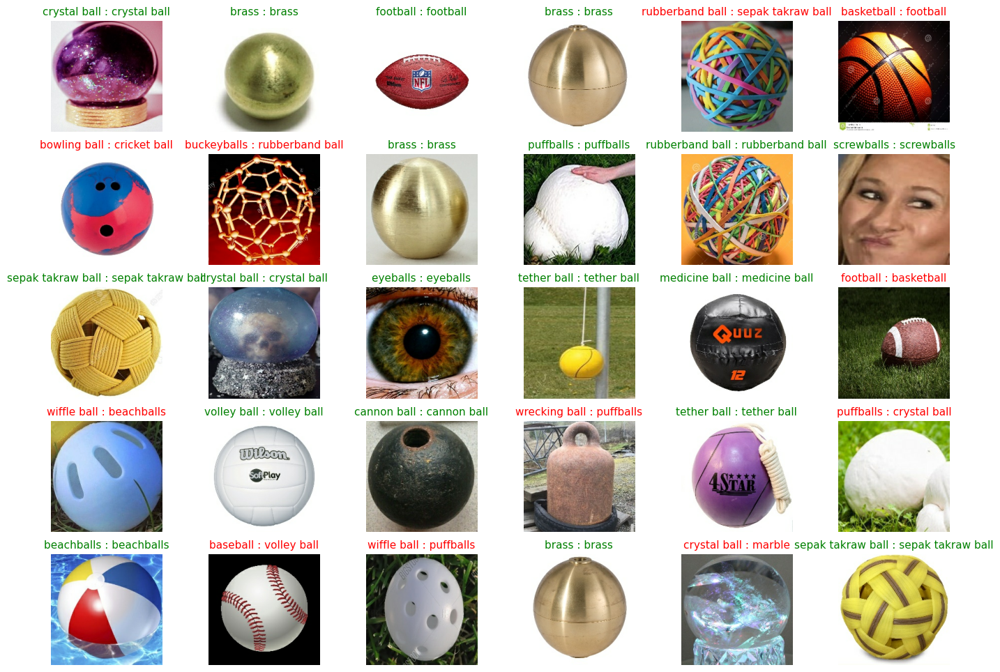

In [21]:
def evaluate_model(dataset, checkpoint_dir=None):

    if not checkpoint_dir:
        checkpoint_dir = "./" + training_config.CHECKPOINT_DIR

    # Load saved model.
    model = tf.keras.models.load_model(checkpoint_dir)

    num_matches = 0
    plt.figure(figsize=(17, 12))
    num_rows = 5
    num_cols = 6
    class_names = dataset.class_names

    # Retrieve a single batch.
    for data_batch, labels_batch in dataset.take(1):

        predictions = model.predict(data_batch)

        for idx in range(num_rows*num_cols):
            ax = plt.subplot(num_rows, num_cols, idx + 1)
            plt.axis("off")
            plt.imshow(data_batch[idx].numpy().astype("uint8"))

            pred_idx = tf.argmax(predictions[idx]).numpy()
            truth_idx = np.nonzero(labels_batch[idx].numpy())

            title = str(class_names[truth_idx[0][0]]) + " : " + str(class_names[pred_idx])
            title_obj = plt.title(title, fontdict={'fontsize':11})

            if pred_idx == truth_idx:
                num_matches += 1
                plt.setp(title_obj, color='g')
            else:
                plt.setp(title_obj, color='r')

            acc = num_matches/(idx+1)
        print("Prediction accuracy: ", int(100*acc)/100)

    return

evaluate_model(valid_dataset, training_config.CHECKPOINT_DIR)


As model achieve around 50% accuracy, it can be visualized. To improve the accurace, it is important to employ techeniques that aid in the accuracy boost. One of suce techenique is **Data Augmentation**.

## 5. Data Augmentation
Data Augmentation is a techenique to mitigate overfitting during training. The way it works, is to simulate more variance in the training dataset. Creating a data augmentation layer is easy, and the layer can be added as a pre-processing layer. This is an effective techenique to improve the validation accuracy of the model.

The idea behind data augmentation is to add more variance in the training dataset by applying various types of transformations to the images. The concept is best described in
Francois Chollet's book: **Deep Learning with Python 2nd Edition** (8.2.5).

"*Overfitting is caused by having too few samples to learn from, rendering you unable to train a model that can generalize to new data. Given infinite data, your model would be exposed to every possible aspect of the data distribution at hand: you would never overfit. Data augmentation takes the approach of generating more training data from existing training samples by augmenting the samples via a number of random transformations that yield believable-looking images. The goal is that, at training time, your model will never see the exact same picture twice. This helps expose the model to more aspects of the data so it can generalize better.*"

There are different approaches that can be used to apply data augmentation. Here, we will cover a very straightforward approach to data augmentation, which uses a Keras pre-processing layer that can be included as part of the model.

### 5.1 Using Keras Augmentation Layers

We start by exploring the use of image augmentation layers in Keras that perform various types of random transformations to images. These transformations can be used to augment the training data during each training epoch. Other transformations are also available, but it's important to visualize any transformation on some samples images from your dataset before using it. Each transformation type has several input configuration options, which should be carefully considered. For example, if your dataset consisted of alphanumeric characters, then randomly flipping images vertically or horizontally would likely result in an inferior model, not a better one. It's also possible to over-due the extent of any given transformation. In the code cell below we define three different transformations separately (rotation, horizontal flipping, and zooming). We have chosen the input configurations for rotation and zooming to be +/- 54 deg for rotation and +/- 50% for zooming. As we will see further below, these configurations work well for this dataset to reduce overfitting and imporve validation accuracy, but it usually takes some amount of experimentation to learn which transformations work best and to what degree they should be applied. For example, if you try using more extreme rotations or zooming, you might find that this may degrade the validation accuracy rather than improve it.

Refer to the Keras documentation page for more details [here](https://keras.io/api/layers/preprocessing_layers/image_augmentation/).

In [22]:
#----------------------------------
# Define random transformations.
#----------------------------------

# Random rotation in either direction as a fraction of 2PI.
rand_rotation = layers.RandomRotation(0.15,                 # = .1*2*PI = +/- 54 deg
                                      fill_mode='nearest',  # Fill points outside boundaries with nearest pixel.
                                      seed=SEED_VALUE)

# Random horizontal flipping.
rand_flip_hor = layers.RandomFlip("horizontal", seed=SEED_VALUE)


# Random zooming.
rand_zoom     = layers.RandomZoom(height_factor=(-.5, .5),  # Zooming IN/OUT, in height up to 50%
                                  width_factor=(-.5, .5),   # Zooming IN/OUT, in width up to 50%
                                  fill_mode='nearest',      # Fill points outside boundaries with nearest pixel.
                                  seed=SEED_VALUE)

Let's define a function that processes a single batch of images through an image transformation. We first retrieve a batch of data from the `BatchDataset` object and then pass the batch of images through the augmentation pipeline multiple times. We then display just the first image in the augmented batch of images so that we can visualize the range and variance of the image transformation that is applied multiple times. This function will display a single row of images for a given transformation.



 Rotation:


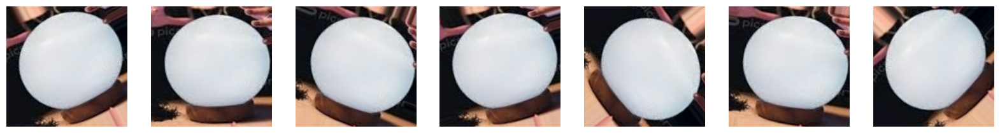



 Horizontal Flip:


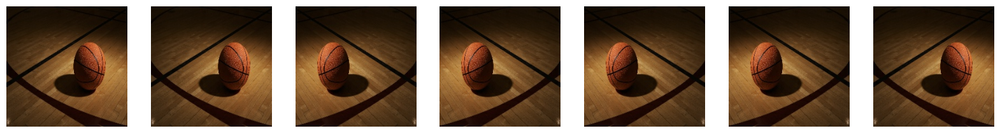



 Zoom:


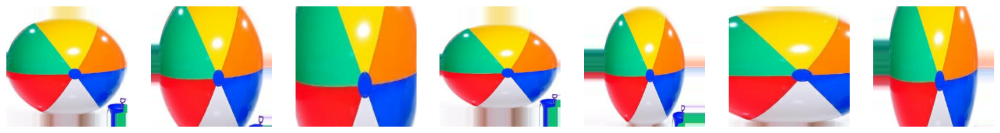

In [23]:
def display_augmentation_rows(dataset, augmentation_pipeline, label=None):
    random.seed(SEED_VALUE)
    num_passes = 7
    plt.figure(figsize=(20, 5))

    # Retrieve a single databach.
    for image_batch, _ in dataset.take(1):

        for i in range(num_passes):

            # Pass the image_batch through the augmentation pipeline.
            augmented_images = augmentation_pipeline(image_batch)

            # Display just the first image from the batch of augmented images.
            ax = plt.subplot(1, num_passes, i + 1)
            plt.imshow(augmented_images[0].numpy().astype("uint8"))
            plt.axis("off")

        break
    print('\n')
    if label:
        print(f"{bold}", label)
    plt.show(block=block_plot)


# Display augmentation samples.
display_augmentation_rows(train_dataset, rand_rotation,  'Rotation:')
display_augmentation_rows(train_dataset, rand_flip_hor,  'Horizontal Flip:')
display_augmentation_rows(train_dataset, rand_zoom,      'Zoom:')


### 5.2 Create a Data Augmentation pipeline
We can now create a data augmentation pipeline using the Keras Sequential API to string together multiple transformations. This is easily accomplished by creating a list from the transformations that we defined in the previous section; Rotation, horizontal flip and Zoom.

In [24]:
# Combine multiple augmentations in a single processing pipeline using a list of transformations.
data_augmentation_pipeline = keras.Sequential(
    [
        rand_rotation,
        rand_flip_hor,
        rand_zoom,
    ])

Let's define another function that processes a single batch of images through the data augmentation pipeline defined above. We first retrieve a batch of data from the `BatchDataset` object and then pass the batch of images through the augmentation pipeline multiple times. We then display just the first image in the augmented batch of images so that we can visualize the range and variance of the image transformation that is applied multiple times. This function will display a grid of images for a given transformation pipeline.

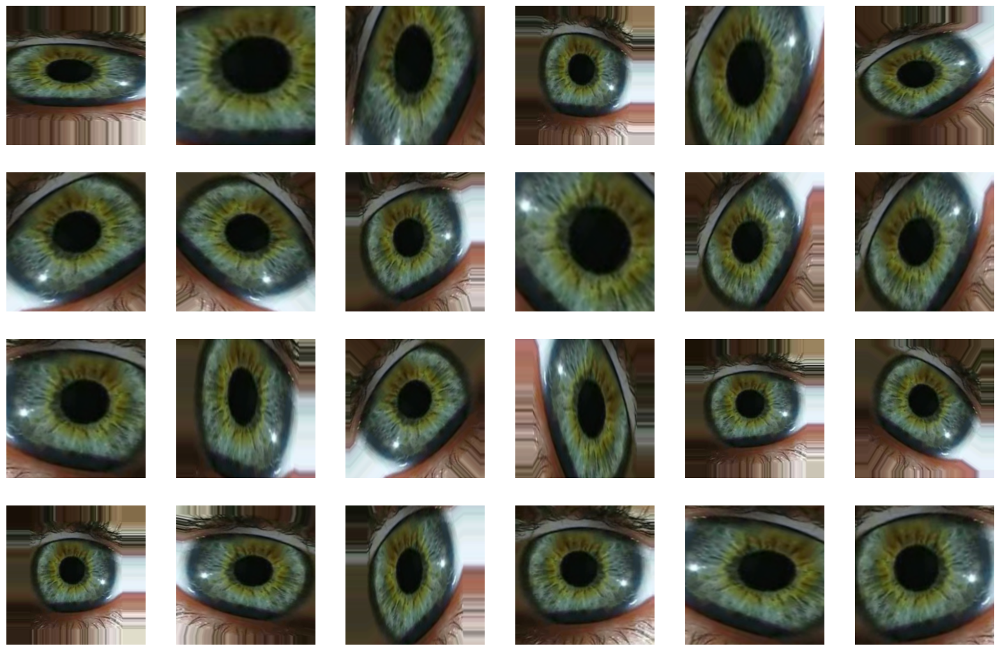

In [25]:
def display_augmentation_grid(dataset, data_augmentation_pipeline, label=None):

    random.seed(SEED_VALUE)
    num_rows = 4
    num_cols = 6
    num_passes = num_rows*num_cols
    plt.figure(figsize=(20, 13))

    # Retrieve a single databach.
    for image_batch, _ in dataset.take(1):

        for i in range(num_passes):

            # Pass the image_batch through the augmentation pipeline.
            augmented_images = data_augmentation_pipeline(image_batch)

            # Display just the first augmented image from the batch of augmented images.
            ax = plt.subplot(num_rows, num_cols, i + 1)
            plt.imshow(augmented_images[0].numpy().astype("uint8"))
            plt.axis("off")

    plt.show(block=block_plot)


# Display
display_augmentation_grid(train_dataset, data_augmentation_pipeline, 'Zoom:')

### 5.3 Add a Data Augmentation Layer to the CNN Model

We can now use the data augmentation pipeline defined above as a pre-processing layer in our model architecture definition below. For every batch of images in the training set, the data augmentation layer applies the random transformations defined in the data augmentation pipeline, so that the data used during each training epoch has been randomized. In other words, during each epoch, the model is trained on a slightly different set of data than previous epochs, which introduces more variance in the training data and helps the model generalize better, which mitigates overfitting.

In [26]:
# Define the model.
def cnn_model_aug(input_shape=(224, 224, 3), num_classes=10):

    #----------------------------------------------
    # Input layer and Conv Block 1: 32-32-MaxPool.
    #----------------------------------------------
    inputs = keras.Input(shape=input_shape)

    # Add data augmentation layer.
    x = data_augmentation_pipeline(inputs)

    x = layers.Rescaling(1./255)(x)

    x = layers.Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPool2D(pool_size=2, strides=2)(x)

    #-----------------------------------
    # Conv Block 2: 64-64-MaxPool.
    #-----------------------------------
    x = layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPool2D(pool_size=2, strides=2)(x)

    #-----------------------------------
    # Conv Block 3: 128-128-MaxPool.
    #-----------------------------------
    x = layers.Conv2D(filters=128, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.Conv2D(filters=128, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPool2D(pool_size=2, strides=2)(x)

    #-----------------------------------
    # Conv Block 4: 256-256-MaxPool.
    #-----------------------------------
    x = layers.Conv2D(filters=256, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.Conv2D(filters=256, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPool2D(pool_size=2, strides=2)(x)

    #------------------------------------
    # Flatten the convolutional features.
    #------------------------------------
    x = layers.Flatten()(x)

    # Fully connected layers.
    x = layers.Dense(512, activation='relu')(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs=inputs, outputs=outputs)

    return model

In [27]:
model = cnn_model_aug(num_classes=data_config.NUM_CLASSES)

### 5.4 Compile and Train the Model


In [28]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=training_config.LEARNING_RATE),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [29]:
# Train the model.
training_results = model.fit(train_dataset,
                             validation_data=valid_dataset,
                             epochs=training_config.EPOCHS,
                             workers=4,
                             use_multiprocessing=True)

Epoch 1/21
57/57 [==============================] - 20s 269ms/step - loss: 3.3388 - accuracy: 0.0590 - val_loss: 3.2317 - val_accuracy: 0.0867
Epoch 2/21
57/57 [==============================] - 16s 272ms/step - loss: 3.1072 - accuracy: 0.1099 - val_loss: 3.0521 - val_accuracy: 0.1200
Epoch 3/21
57/57 [==============================] - 16s 275ms/step - loss: 2.8845 - accuracy: 0.1755 - val_loss: 2.8247 - val_accuracy: 0.1800
Epoch 4/21
57/57 [==============================] - 17s 293ms/step - loss: 2.7040 - accuracy: 0.2284 - val_loss: 2.6096 - val_accuracy: 0.2467
Epoch 5/21
57/57 [==============================] - 15s 264ms/step - loss: 2.5111 - accuracy: 0.2857 - val_loss: 2.3988 - val_accuracy: 0.3533
Epoch 6/21
57/57 [==============================] - 16s 270ms/step - loss: 2.3268 - accuracy: 0.3338 - val_loss: 2.3759 - val_accuracy: 0.3467
Epoch 7/21
57/57 [==============================] - 16s 266ms/step - loss: 2.1953 - accuracy: 0.3786 - val_loss: 2.0230 - val_accuracy: 0.4000

An improved validation accuracy due to data augmentation.

### 5.5 Plot Training Results


In [39]:
def plot_results(metrics, ylabel=None, ylim=None, metric_name=None, color=None, title=None, block_plot=False):
    fig, ax = plt.subplots(figsize=(15, 4))

    if not (isinstance(metric_name, list) or isinstance(metric_name, tuple)):
        metrics = [metrics]
        metric_name = [metric_name]

    for idx, metric in enumerate(metrics):
        ax.plot(metric, color=color[idx])

    plt.xlabel("Epoch")
    plt.ylabel(ylabel)
    plt.title(title)  # Use the title parameter here
    plt.xlim([0, training_config.EPOCHS-1])
    plt.ylim(ylim)
    ax.xaxis.set_major_locator(MultipleLocator(2))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    plt.grid(True)
    plt.legend(metric_name)
    plt.show(block=block_plot)
    plt.close()

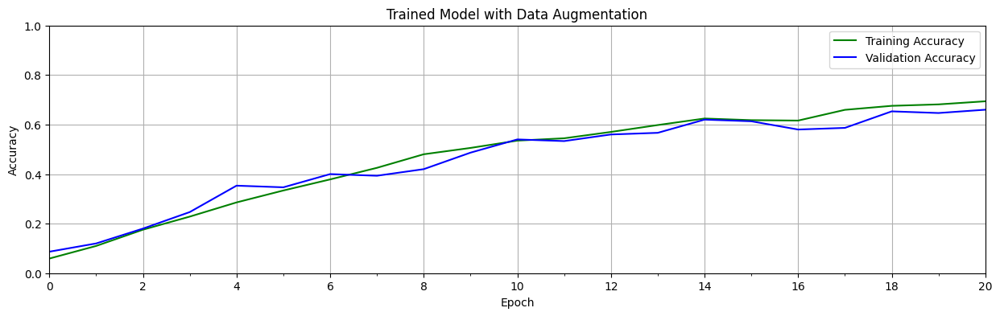

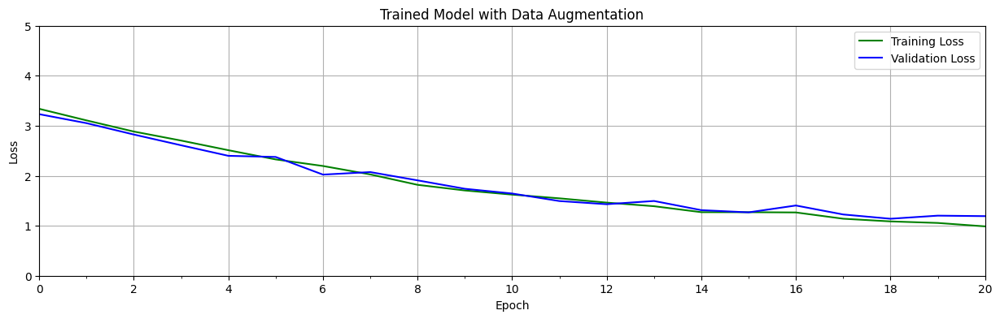

In [41]:
# Retrieve training results.
train_loss = training_results.history["loss"]
train_acc  = training_results.history["accuracy"]
valid_loss = training_results.history["val_loss"]
valid_acc  = training_results.history["val_accuracy"]

plot_results([ train_acc, valid_acc ],
             title="Trained Model with Data Augmentation",
             ylabel="Accuracy",
             ylim = [0.0, 1.0],
             metric_name=["Training Accuracy", "Validation Accuracy"],
             color=["g", "b"])

plot_results([ train_loss, valid_loss ],
             title="Trained Model with Data Augmentation",
             ylabel="Loss",
             ylim = [0.0, 5.0],
             metric_name=["Training Loss", "Validation Loss"],
             color=["g", "b"]);

The model doesnt generalize well on the validation data, b/c there is not enough data for a model to learn different variations of the same class, a potential to general learning. Seeing a small dataset, makes it quite narrow, that only performs well on the training data, but not on the validation data. This is a classic patern of overfitting.

This is not only the amount of data, but the quality of the data interms of representing the possible variations that would normally be encountered for a given application.

### 5.6 Evaluate the Model
Evaluating on the test dataset, and check how well the model performs.

In [43]:
test_loss, test_acc = model.evaluate(test_dataset)

3/3 [==============================] - 1s 112ms/step - loss: 1.3030 - accuracy: 0.6200


Thats near validation figs. Here, we will use a function that will call the `predict()` method on a portion of the test dadaset, just so we can visualize the results on some of the images.

2/2 [==============================] - 0s 50ms/step
Prediction accuracy:  0.63


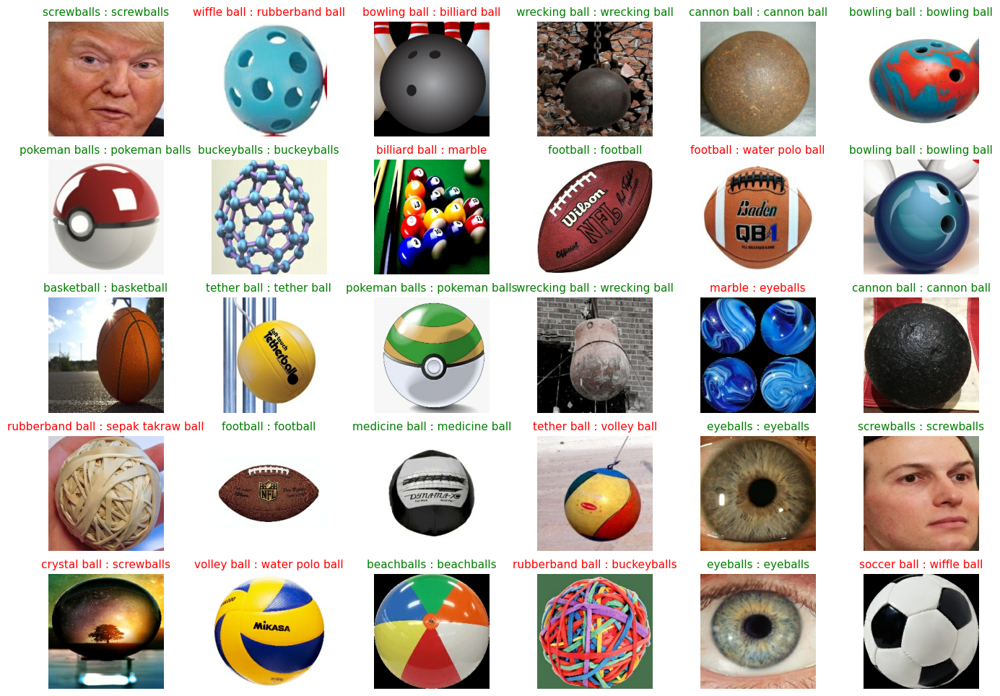

In [45]:
evaluate_model(test_dataset, model)

## 6. Conclusion
Overfitting is a common problem in deep learning. **Data augmentation** can mitigate the effects of overfitting by augmenting the training data with random transformations during each training epoch. Keep in mind that data augmentation is only applied to the training.